# <b>Assignment : DT</b>

<font color='red'><b> Please check below video before attempting this assignment</b></font>

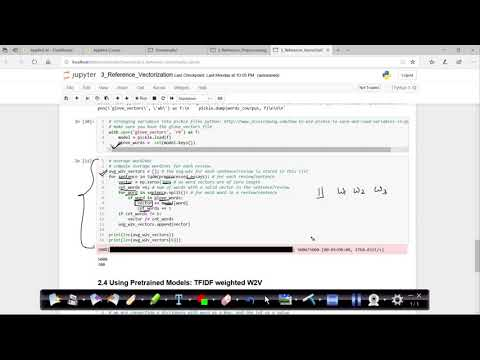

In [1]:
from IPython.display import YouTubeVideo
YouTubeVideo('ZhLXULFjIjQ', width="1000",height="500")

<font color='red'><b> TF-IDFW2V</b></font>

<b>Tfidf w2v (w1,w2..) = (tfidf(w1) * w2v(w1) + tfidf(w2) * w2v(w2) + …)  /    (tfidf(w1) + tfidf(w2) + …)</b>

<b>(Optional) Please check course video on [AVgw2V and TF-IDFW2V ](https://www.appliedaicourse.com/lecture/11/applied-machine-learning-online-course/2916/avg-word2vec-tf-idf-weighted-word2vec/3/module-3-foundations-of-natural-language-processing-and-machine-learning)for more details.

<font color='blue'><b>Glove vectors </b></font>

<b>In this assignment you will be working with glove vectors , please check  [this](https://en.wikipedia.org/wiki/GloVe_(machine_learning)) and [this](https://en.wikipedia.org/wiki/GloVe_(machine_learning)) for more details.</b><br>

Download glove vectors from this [link ](https://drive.google.com/file/d/1lDca_ge-GYO0iQ6_XDLWePQFMdAA2b8f/view?usp=sharing)

In [2]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/

import pickle
from tqdm import tqdm
import os

from chart_studio import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

In [3]:
#please use below code to load glove vectors 
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

or else , you can use below code

In [4]:
'''
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================

words = []
for i in preproced_texts:
    words.extend(i.split(' '))

for i in preproced_titles:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)


'''

'\n# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039\ndef loadGloveModel(gloveFile):\n    print ("Loading Glove Model")\n    f = open(gloveFile,\'r\', encoding="utf8")\n    model = {}\n    for line in tqdm(f):\n        splitLine = line.split()\n        word = splitLine[0]\n        embedding = np.array([float(val) for val in splitLine[1:]])\n        model[word] = embedding\n    print ("Done.",len(model)," words loaded!")\n    return model\nmodel = loadGloveModel(\'glove.42B.300d.txt\')\n\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n\nwords = []\nfor i in preproced_texts:\n    words.extend(i.split(\' \'))\n\nfor i in preproced_titles:\n    words.extend(i.split(\' \'))\nprint("all the words in the coupus", len(words))\nwords = set(words)\nprint("the unique words in the coupus", len(words))\n\ninter_words = set(model.keys()).intersection(word

# <font color='red'> <b>Task - 1</b></font>

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features +  preprocessed_essay (TFIDF) + Sentiment scores(preprocessed_essay)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features +  preprocessed_essay (TFIDF W2V) + Sentiment scores(preprocessed_essay)</li>        </ul>
    </li>
    <li><strong>The hyper paramter tuning (best `depth` in range [1, 5, 10, 50], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation(use gridsearch cv or randomsearch cv)/simple cross validation data(you can write your own for loops refer sample solution)</li>
        </ul>
    </li>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/Gp2DQmh.jpg' width=500px> with X-axis as <strong>min_sample_split</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/fgN9aUP.jpg' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>min_sample_split</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='https://i.imgur.com/wMQDTFe.jpg' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='https://i.imgur.com/IdN5Ctv.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud(https://www.geeksforgeeks.org/generating-word-cloud-python/) with the words of essay text of these `false positive data points`</li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
   

# <font color='red'><b> Task - 2 </b></font>

For this task consider **set-1** features.

*  Select all the features which are having non-zero feature importance.You can get the feature importance using  'feature_importances_` 
   (https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html), discard the all other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM).
*  You need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3<br>
  **Note**: when you want to find the feature importance make sure you don't use max_depth parameter keep it None.
  </li>
    <br>
You need to summarize the results at the end of the notebook, summarize it in the table format
        <img src='http://i.imgur.com/YVpIGGE.jpg' width=400px>
    </li>
</ol>

<font color='blue'><b>Hint for calculating Sentiment scores</b></font>

In [5]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\shams\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [6]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# import nltk
# nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

for_sentiment = 'a person is a person no matter how small dr seuss i teach the smallest students with the biggest enthusiasm \
for learning my students learn in many different ways using all of our senses and multiple intelligences i use a wide range\
of techniques to help all my students succeed students in my class come from a variety of different backgrounds which makes\
for wonderful sharing of experiences and cultures including native americans our school is a caring community of successful \
learners which can be seen through collaborative student project based learning in and out of the classroom kindergarteners \
in my class love to work with hands on materials and have many different opportunities to practice a skill before it is\
mastered having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum\
montana is the perfect place to learn about agriculture and nutrition my students love to role play in our pretend kitchen\
in the early childhood classroom i have had several kids ask me can we try cooking with real food i will take their idea \
and create common core cooking lessons where we learn important math and writing concepts while cooking delicious healthy \
food for snack time my students will have a grounded appreciation for the work that went into making the food and knowledge \
of where the ingredients came from as well as how it is healthy for their bodies this project would expand our learning of \
nutrition and agricultural cooking recipes by having us peel our own apples to make homemade applesauce make our own bread \
and mix up healthy plants from our classroom garden in the spring we will also create our own cookbooks to be printed and \
shared with families students will gain math and literature skills as well as a life long enjoyment for healthy cooking \
nannan'
ss = sid.polarity_scores(for_sentiment)

for k in ss:
    print('{0}: {1}, '.format(k, ss[k]), end='')

# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

neg: 0.01, neu: 0.745, pos: 0.245, compound: 0.9975, 

<h1>1. Decision Tree </h1>

## 1.1 Loading Data

In [7]:
import pandas
data = pandas.read_csv('preprocessed_data.csv')

In [8]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

In [9]:
data.head(2)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05
1,ut,ms,grades_3_5,4,1,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03


In [10]:
print("Number of data points in data", data.shape)
print('-'*50)
print("The attributes of data :", data.columns.values)

Number of data points in data (109248, 9)
--------------------------------------------------
The attributes of data : ['school_state' 'teacher_prefix' 'project_grade_category'
 'teacher_number_of_previously_posted_projects' 'project_is_approved'
 'clean_categories' 'clean_subcategories' 'essay' 'price']


# Splitting data into Train and cross validation(or test): Stratified Sampling

In [11]:
Y = data['project_is_approved'].values
data.drop(['project_is_approved'], axis=1, inplace=True)

In [12]:
X = data
X.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05


In [13]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, stratify=Y)

# Make Data Model Ready: encoding eassay

# Vectorizing Text Data:

## TFIDF vectorizer

In [14]:
preprocessed_essays_tr = X_train['essay'].values
preprocessed_essays_ts = X_test['essay'].values

In [15]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer_essay_tfidf = TfidfVectorizer(min_df=10)

essay_tfidf_tr = vectorizer_essay_tfidf.fit_transform(preprocessed_essays_tr)
print("Shape of matrix after X_train vectorization",essay_tfidf_tr.shape)

essay_tfidf_ts = vectorizer_essay_tfidf.transform(preprocessed_essays_ts)
print("Shape of matrix after X_test vectorization",essay_tfidf_ts.shape)

Shape of matrix after X_train vectorization (76473, 14416)
Shape of matrix after X_test vectorization (32775, 14416)


## TFIDF weighted W2V

In [16]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [17]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model_tr = TfidfVectorizer()
tfidf_model_tr.fit(preprocessed_essays_tr)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary_tr = dict(zip(tfidf_model_tr.get_feature_names(), list(tfidf_model_tr.idf_)))
tfidf_words_tr = set(tfidf_model_tr.get_feature_names())

In [18]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_tr = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_tr): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words_tr):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary_tr[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_tr.append(vector)

print(len(tfidf_w2v_vectors_tr))
print(len(tfidf_w2v_vectors_tr[0]))


100%|███████████████████████████████████████████████████████████████████████████| 76473/76473 [02:13<00:00, 574.37it/s]

76473
300


In [19]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model_ts = TfidfVectorizer()
tfidf_model_ts.fit(preprocessed_essays_ts)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary_ts = dict(zip(tfidf_model_ts.get_feature_names(), list(tfidf_model_ts.idf_)))
tfidf_words_ts = set(tfidf_model_ts.get_feature_names())

In [ ]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_ts = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_ts): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words_ts):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary_ts[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_ts.append(vector)

print(len(tfidf_w2v_vectors_ts))
print(len(tfidf_w2v_vectors_ts[0]))

 96%|███████████████████████████████████████████████████████████████████████▋   | 31316/32775 [01:00<00:02, 548.35it/s]

## Vectorizing Catagorical Features:

In [ ]:
vectorizer = CountVectorizer(binary=True)

school_state_ohe_tr = vectorizer.fit_transform(X_train['school_state'].values)
print("Shape of X_train matrix after one hot encodig ",school_state_ohe_tr.shape)

school_state_ohe_ts = vectorizer.transform(X_test['school_state'].values)
print("Shape of X_test matrix after one hot encodig ",school_state_ohe_ts.shape)

In [ ]:
vectorizer = CountVectorizer(binary=True)

clean_categories_ohe_tr = vectorizer.fit_transform(X_train['clean_categories'].values)
print("Shape of X_train matrix after one hot encodig ",clean_categories_ohe_tr.shape)

clean_categories_ohe_ts = vectorizer.transform(X_test['clean_categories'].values)
print("Shape of X_test matrix after one hot encodig ",clean_categories_ohe_ts.shape)

In [ ]:
vectorizer = CountVectorizer(binary=True)

clean_subcategories_ohe_tr = vectorizer.fit_transform(X_train['clean_subcategories'].values)
print("Shape of X_train matrix after one hot encodig ",clean_subcategories_ohe_tr.shape)

clean_subcategories_ohe_ts = vectorizer.transform(X_test['clean_subcategories'].values)
print("Shape of X_test matrix after one hot encodig ",clean_subcategories_ohe_ts.shape)

In [ ]:
vectorizer = CountVectorizer(binary=True)

project_grade_category_ohe_tr = vectorizer.fit_transform(X_train['project_grade_category'].values)
print("Shape of X_train matrix after one hot encodig ",project_grade_category_ohe_tr.shape)

project_grade_category_ohe_ts = vectorizer.transform(X_test['project_grade_category'].values)
print("Shape of X_test matrix after one hot encodig ",project_grade_category_ohe_ts.shape)

In [ ]:
project_grade_category_ohe_tr

In [26]:
vectorizer = CountVectorizer(binary=True)

teacher_prefix_ohe_tr = vectorizer.fit_transform(X_train['teacher_prefix'].values)
print("Shape of X_train matrix after one hot encodig ",teacher_prefix_ohe_tr.shape)

teacher_prefix_ohe_ts = vectorizer.transform(X_test['teacher_prefix'].values)
print("Shape of X_test matrix after one hot encodig ",teacher_prefix_ohe_ts.shape)

Shape of X_train matrix after one hot encodig  (76473, 5)
Shape of X_test matrix after one hot encodig  (32775, 5)


## Encoding Numerical Features:

In [27]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()

normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

teacher_number_of_previously_posted_projects_normalised_tr = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

teacher_number_of_previously_posted_projects_normalised_ts = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

print("="*100)
print(teacher_number_of_previously_posted_projects_normalised_tr.shape, Y_train.shape)
print(teacher_number_of_previously_posted_projects_normalised_ts.shape, Y_test.shape)
print("="*100)

(76473, 1) (76473,)
(32775, 1) (32775,)


In [28]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()

normalizer.fit(X_train['price'].values.reshape(-1,1))

price_normalised_tr = normalizer.transform(X_train['price'].values.reshape(-1,1))

price_normalised_ts = normalizer.transform(X_test['price'].values.reshape(-1,1))

print("="*100)
print(price_normalised_tr.shape, Y_train.shape)
print(price_normalised_ts.shape, Y_test.shape)
print("="*100)

(76473, 1) (76473,)
(32775, 1) (32775,)


## Sentiment Score:

In [29]:
import nltk
nltk.download('vader_lexicon')

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()
tr_sentiment_scores = []
for essay in X_train['essay']:
    ss = sid.polarity_scores(essay)
    tr_sentiment_scores.append(ss)
    
# print(tr_sentiment_scores)


from operator import itemgetter
neg_tr = list(map(itemgetter("neg"), tr_sentiment_scores))
neu_tr = list(map(itemgetter("neu"), tr_sentiment_scores))
pos_tr = list(map(itemgetter("pos"), tr_sentiment_scores))
compound_tr = list(map(itemgetter("compound"), tr_sentiment_scores))

neg_tr = np.array(neg_tr)
neu_tr = np.array(neu_tr)
pos_tr = np.array(pos_tr)
compound_tr = np.array(compound_tr)

print('neg_tr : ',neg_tr.shape)
print('neu_tr : ',neu_tr.shape)
print('pos_tr : ',pos_tr.shape)
print('compound_tr : ',compound_tr.shape)



# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\shams\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


neg_tr :  (76473,)
neu_tr :  (76473,)
pos_tr :  (76473,)
compound_tr :  (76473,)


In [30]:
import nltk
nltk.download('vader_lexicon')

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()
ts_sentiment_scores = []
for essay in X_test['essay']:
    ss = sid.polarity_scores(essay)
    ts_sentiment_scores.append(ss)
    
# print(tr_sentiment_scores)


from operator import itemgetter
neg_ts = list(map(itemgetter("neg"), ts_sentiment_scores))
neu_ts = list(map(itemgetter("neu"), ts_sentiment_scores))
pos_ts = list(map(itemgetter("pos"), ts_sentiment_scores))
compound_ts = list(map(itemgetter("compound"), ts_sentiment_scores))

neg_ts = np.array(neg_ts)
neu_ts = np.array(neu_ts)
pos_ts = np.array(pos_ts)
compound_ts = np.array(compound_ts)

print('neg_ts : ',neg_ts.shape)
print('neu_ts : ',neu_ts.shape)
print('pos_ts : ',pos_ts.shape)
print('compound_ts : ',compound_ts.shape)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\shams\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


neg_ts :  (32775,)
neu_ts :  (32775,)
pos_ts :  (32775,)
compound_ts :  (32775,)


In [31]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()

normalizer.fit(neg_tr.reshape(-1,1))

neg_tr_normalised = normalizer.transform(neg_tr.reshape(-1,1))

neg_ts_normalised = normalizer.transform(neg_ts.reshape(-1,1))


print("="*100)
print(neg_tr_normalised.shape)
print(neg_ts_normalised.shape)
print("="*100)

(76473, 1)
(32775, 1)


In [32]:
normalizer.fit(neu_tr.reshape(-1,1))

neu_tr_normalised = normalizer.transform(neu_tr.reshape(-1,1))

neu_ts_normalised = normalizer.transform(neu_ts.reshape(-1,1))


print("="*100)
print(neu_tr_normalised.shape)
print(neu_ts_normalised.shape)
print("="*100)

(76473, 1)
(32775, 1)


In [33]:
normalizer.fit(pos_tr.reshape(-1,1))

pos_tr_normalised = normalizer.transform(pos_tr.reshape(-1,1))

pos_ts_normalised = normalizer.transform(pos_ts.reshape(-1,1))


print("="*100)
print(pos_tr_normalised.shape)
print(pos_ts_normalised.shape)
print("="*100)

(76473, 1)
(32775, 1)


In [34]:
normalizer.fit(neg_tr.reshape(-1,1))

compound_tr_normalised = normalizer.transform(compound_tr.reshape(-1,1))

compound_ts_normalised = normalizer.transform(compound_ts.reshape(-1,1))


print("="*100)
print(compound_tr_normalised.shape)
print(compound_ts_normalised.shape)
print("="*100)

(76473, 1)
(32775, 1)


# Appling DT

# Set 1 TFIDF

In [35]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
set_1_tr = hstack((clean_categories_ohe_tr, clean_subcategories_ohe_tr, school_state_ohe_tr, project_grade_category_ohe_tr, teacher_prefix_ohe_tr, teacher_number_of_previously_posted_projects_normalised_tr, price_normalised_tr, essay_tfidf_tr, neg_tr_normalised, neu_tr_normalised, pos_tr_normalised, compound_tr_normalised)).tocsr()
set_1_ts = hstack((clean_categories_ohe_ts, clean_subcategories_ohe_ts, school_state_ohe_ts, project_grade_category_ohe_ts, teacher_prefix_ohe_ts, teacher_number_of_previously_posted_projects_normalised_ts, price_normalised_ts, essay_tfidf_ts, neg_ts_normalised, neu_ts_normalised, pos_ts_normalised, compound_ts_normalised)).tocsr()
print("Set 1 TFIDF")
print(set_1_tr.shape)
print(set_1_ts.shape)



Set 1 TFIDF
(76473, 14583)
(32775, 14583)


In [36]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
import math
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier(random_state=42, class_weight = 'balanced')

dtc.fit(set_1_tr, Y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced', criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [37]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

parameters = {'max_depth': [1, 5, 10, 50], 'min_samples_split' : [5, 10, 100, 500]}
gscv = GridSearchCV(dtc, parameters , cv=3, scoring = 'roc_auc',return_train_score = True, n_jobs = 1)
gscv.fit(set_1_tr, Y_train)

res = pd.DataFrame(gscv.cv_results_)
res = res.sort_values(['param_max_depth'])

cv_auc1 = res['mean_test_score'].values
train_auc1 = res['mean_train_score'].values

print('Best Parameters = {}'.format(gscv.best_params_))
print()
print('Best Score = {}'.format(gscv.best_score_))


Best Parameters = {'max_depth': 10, 'min_samples_split': 500}

Best Score = 0.6273539943890903


# 3D Scatter Plot

In [38]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

x1 = [5, 10, 100, 500]
y1 = [1, 5, 10, 50]
z1 = train_auc1

x2 = [5, 10, 100, 500]
y2 = [1, 5, 10, 50]
z2 = cv_auc1

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

# Hyperparmeter Tuning:

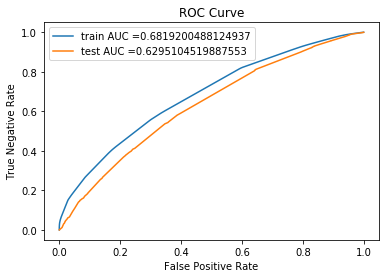

In [39]:
model_1 = DecisionTreeClassifier(max_depth= 10, min_samples_split= 500, class_weight = 'balanced')
model_1.fit(set_1_tr, Y_train)


train_fpr, train_tpr, thresholds = roc_curve(Y_train, model_1.predict_proba(set_1_tr)[:,1])
test_fpr, test_tpr, thresholds = roc_curve(Y_test, model_1.predict_proba(set_1_ts)[:,1])

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Negative Rate")
plt.title("ROC Curve")
plt.show()

# Confusion Matrix:

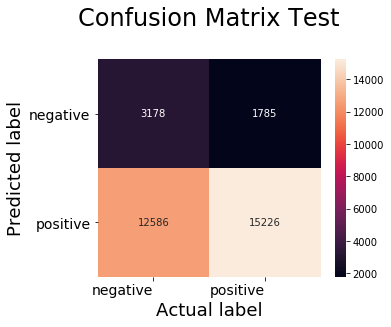

In [40]:
class_names = ['negative','positive']
df_heatmap_tfidf = pd.DataFrame(confusion_matrix(Y_test, model_1.predict(set_1_ts)), index=class_names, columns=class_names )
fig = plt.figure(figsize=(5,4))
heatmap_tfidf = sns.heatmap(df_heatmap_tfidf, annot=True, fmt="d")

heatmap_tfidf.yaxis.set_ticklabels(heatmap_tfidf.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap_tfidf.xaxis.set_ticklabels(heatmap_tfidf.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
plt.ylabel('Predicted label',size=18)
plt.xlabel('Actual label',size=18)
plt.title("Confusion Matrix Test\n",size=24)
plt.show()

# Seperating False Positives:

In [41]:
#https://stackoverflow.com/questions/43193880/how-to-get-row-number-in-dataframe-in-pandas
FP=pd.DataFrame({"Actual":Y_test, "Predicted":model_1.predict(set_1_ts)})
FP_indexs_1=list(FP[(FP["Actual"]==0) & (FP["Predicted"]==1)].index)
FP_1=FP[(FP["Actual"]==0) & (FP["Predicted"]==1)]
len(FP_indexs_1)
FalsePositives = []
for i in tqdm(FP_indexs_1):
    FalsePositives.append(X_test['essay'].values[i])

100%|██████████████████████████████████████████████████████████████████████████| 1785/1785 [00:00<00:00, 298303.95it/s]


In [42]:
print(len(FalsePositives))

1785


# Word Cloud:

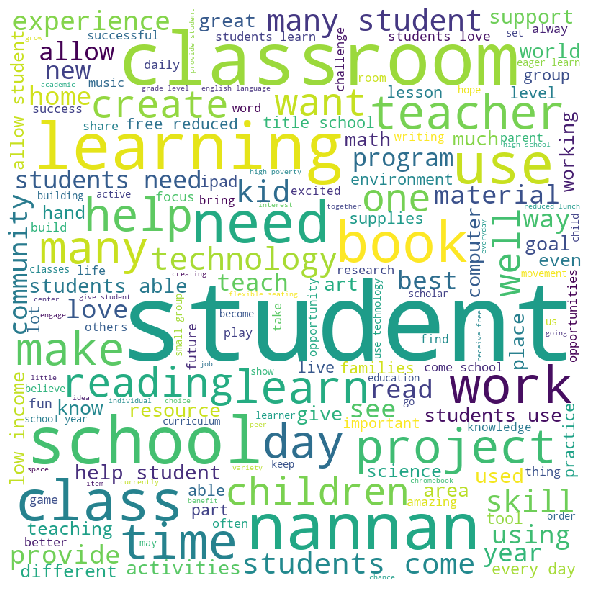

In [43]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 
  
  
comment_words = '' 
stopwords = set(STOPWORDS) 
  
for sent in FalsePositives:
    each_word_list = sent.split()
    each_word_list = [single_word.lower() for single_word in each_word_list]
    comment_words = comment_words + " ".join(each_word_list)+" "
      

  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

# Box Plot:

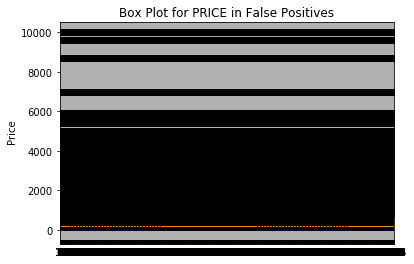

In [44]:
price=[]
for i in FP_indexs_1:
    price.append(X_test['price'].values)
plt.boxplot(price)
plt.title('Box Plot for PRICE in False Positives')
plt.ylabel('Price')
plt.grid()
plt.show()

# PDF:

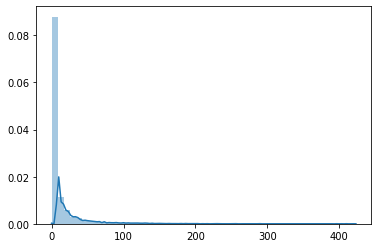

In [45]:
teacher_number_of_previously_posted_projects=[]

for i in FP_indexs_1:
    teacher_number_of_previously_posted_projects.append(X_test['teacher_number_of_previously_posted_projects'].values)

import seaborn as sns, numpy as np
ax = sns.distplot(teacher_number_of_previously_posted_projects)

# Set 2 TFIDF W2V

In [46]:
set_2_tr = hstack((clean_categories_ohe_tr, clean_subcategories_ohe_tr, school_state_ohe_tr, project_grade_category_ohe_tr, teacher_prefix_ohe_tr, teacher_number_of_previously_posted_projects_normalised_tr, price_normalised_tr, tfidf_w2v_vectors_tr, neg_tr_normalised, neu_tr_normalised, pos_tr_normalised, compound_tr_normalised)).tocsr()
set_2_ts = hstack((clean_categories_ohe_ts, clean_subcategories_ohe_ts, school_state_ohe_ts, project_grade_category_ohe_ts, teacher_prefix_ohe_ts, teacher_number_of_previously_posted_projects_normalised_ts, price_normalised_ts, tfidf_w2v_vectors_ts, neg_ts_normalised, neu_ts_normalised, pos_ts_normalised, compound_ts_normalised)).tocsr()
print("Set 2 TFIDF AVG W2V")
print(set_2_tr.shape)
print(set_2_ts.shape)

Set 2 TFIDF AVG W2V
(76473, 405)
(32775, 405)


# Applying DT:

In [47]:
from sklearn.tree import DecisionTreeClassifier
dtc2 = DecisionTreeClassifier(random_state=42, class_weight = 'balanced')

dtc2.fit(set_2_tr, Y_train)
# Y_tr_pred_s2 = clf.predict(set_2_tr)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced', criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [48]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

parameters = {'max_depth': [1, 5, 10, 50], 'min_samples_split' : [5, 10, 100, 500]}
gscv2 = GridSearchCV(dtc2, parameters , cv=3, scoring = 'roc_auc',return_train_score = True, n_jobs = 1)
gscv2.fit(set_2_tr, Y_train)

res2 = pd.DataFrame(gscv2.cv_results_)
res2 = res2.sort_values(['param_max_depth'])

cv_auc2 = res2['mean_test_score'].values
train_auc2 = res2['mean_train_score'].values

print('Best Parameters = {}'.format(gscv2.best_params_))
print()
print('Best Score = {}'.format(gscv2.best_score_))


Best Parameters = {'max_depth': 5, 'min_samples_split': 100}

Best Score = 0.6114219136551036


# 3D Plot:

In [49]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

x1 = [5, 10, 100, 500]
y1 = [1, 5, 10, 50]
z1 = train_auc2

x2 = [5, 10, 100, 500]
y2 = [1, 5, 10, 50]
z2 = cv_auc2

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

# Hyperparameter Tuning:

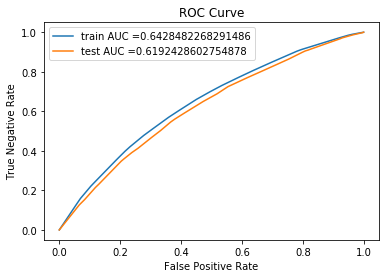

In [50]:
model_2 = DecisionTreeClassifier(max_depth= 5, min_samples_split= 500)
model_2.fit(set_2_tr, Y_train)


train_fpr, train_tpr, thresholds = roc_curve(Y_train, model_2.predict_proba(set_2_tr)[:,1])
test_fpr, test_tpr, thresholds = roc_curve(Y_test, model_2.predict_proba(set_2_ts)[:,1])

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Negative Rate")
plt.title("ROC Curve")
plt.show()

# Confusion Matrix:

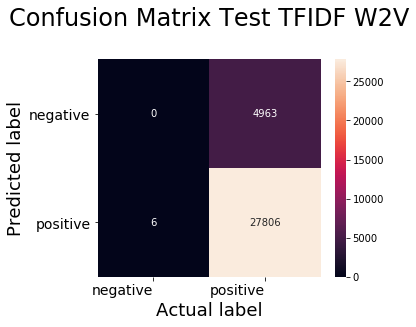

In [51]:
class_names = ['negative','positive']
df_heatmap_tfidf_w2v = pd.DataFrame(confusion_matrix(Y_test, model_2.predict(set_2_ts)), index=class_names, columns=class_names )
fig = plt.figure(figsize=(5,4))
heatmap_tfidf_w2v = sns.heatmap(df_heatmap_tfidf_w2v, annot=True, fmt="d")

heatmap_tfidf_w2v.yaxis.set_ticklabels(heatmap_tfidf_w2v.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap_tfidf_w2v.xaxis.set_ticklabels(heatmap_tfidf_w2v.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
plt.ylabel('Predicted label',size=18)
plt.xlabel('Actual label',size=18)
plt.title("Confusion Matrix Test TFIDF W2V\n",size=24)
plt.show()

# Seperating False Positives:

In [52]:
#https://stackoverflow.com/questions/43193880/how-to-get-row-number-in-dataframe-in-pandas
FP=pd.DataFrame({"Actual":Y_test, "Predicted":model_2.predict(set_2_ts)})
FP_indexs_2=list(FP[(FP["Actual"]==0) & (FP["Predicted"]==1)].index)
FP_2=FP[(FP["Actual"]==0) & (FP["Predicted"]==1)]
len(FP_indexs_2)
FalsePositives2 = []
for i in tqdm(FP_indexs_2):
    FalsePositives2.append(X_test['essay'].values[i])

100%|██████████████████████████████████████████████████████████████████████████| 4963/4963 [00:00<00:00, 332009.49it/s]


In [53]:
print(len(FalsePositives2))

4963


# Word Cloud:

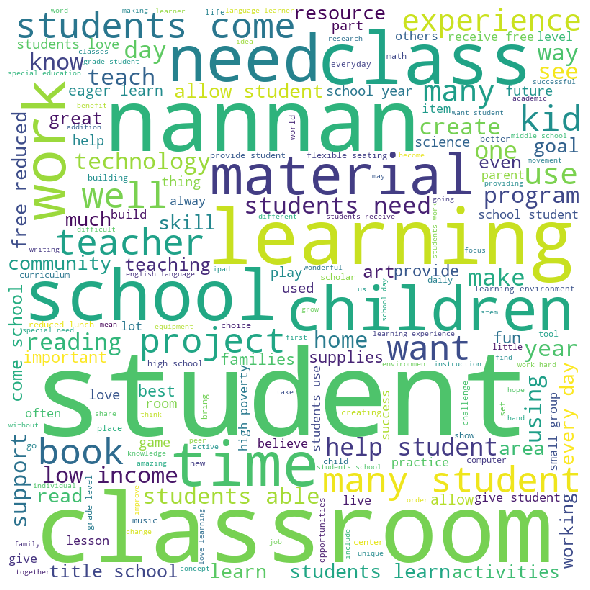

In [54]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 
  
  
comment_words = '' 
stopwords = set(STOPWORDS) 
  
for sent in FalsePositives2:
    each_word_list = sent.split()
    each_word_list = [single_word.lower() for single_word in each_word_list]
    comment_words = comment_words + " ".join(each_word_list)+" "
      

  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

# Box Plot:

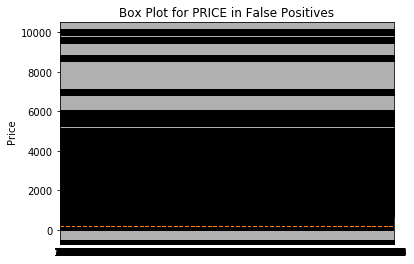

In [55]:
price=[]
for i in FP_indexs_2:
    price.append(X_test['price'].values)

plt.boxplot(price)
plt.title('Box Plot for PRICE in False Positives')
plt.ylabel('Price')
plt.grid()
plt.show()

# PDF:

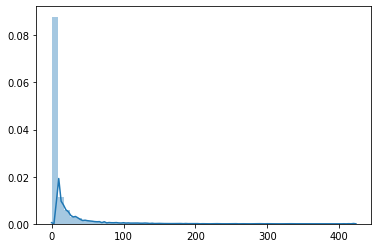

In [56]:
teacher_number_of_previously_posted_projects_2=[]

for i in FP_indexs_2:
    teacher_number_of_previously_posted_projects_2.append(X_test['teacher_number_of_previously_posted_projects'].values)

import seaborn as sns, numpy as np
ax = sns.distplot(teacher_number_of_previously_posted_projects_2)

# Task 2:

In [57]:
clf = DecisionTreeClassifier(max_depth=None, min_samples_split=500, random_state=42, class_weight = 'balanced')
clf.fit(set_1_tr, Y_train)
ftr = clf.feature_importances_
imp_ftr = ftr[np.where(ftr != 0)]
list_of_imp_ftr = list(imp_ftr)
df1 = pd.DataFrame(set_1_tr.todense())
X_train_imp_ftr = df1.iloc[:,list_of_imp_ftr]
df2 = pd.DataFrame(set_1_ts.todense())
X_test_imp_ftr = df2.iloc[:,list_of_imp_ftr]

In [58]:
indices = np.where(ftr)[0]
print(indices)
print(len(indices))

[    8    20    21 ... 14541 14547 14548]
1318


In [59]:
X2_tr = set_1_tr.tocsr()[:,indices]
X2_ts = set_1_ts.tocsr()[:,indices]

In [60]:
print(X2_tr.shape)
print(X2_ts.shape)

(76473, 1318)
(32775, 1318)


# Applying Logistic Regression:

In [61]:
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
alpha = [0.000001,0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000,100000] 
parameter = {'C': [0.000001,0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000,100000]}
auc_cv_t2=[]
auc_tr_t2=[]
for i in alpha:
        lr = LogisticRegression(C=i)
        lr.fit(X2_tr, Y_train)
cc = GridSearchCV(lr, parameter, cv=3, scoring = 'roc_auc',return_train_score = True, n_jobs = 1)
cc.fit(X2_tr, Y_train)

result_t2 = pd.DataFrame(cc.cv_results_)

cv_auc = result_t2['mean_test_score'].values
train_auc = result_t2['mean_train_score'].values

print('Best Parameters = {}'.format(cc.best_params_))
print()
print('Best Score = {}'.format(cc.best_score_))



Best Parameters = {'C': 1}

Best Score = 0.7181886034808292


# Hyperparameter Tuning:

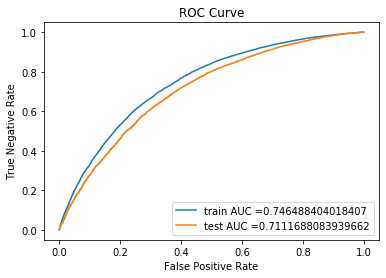

In [62]:
model_3 = LogisticRegression(C = 1)
model_3.fit(X2_tr, Y_train)


train_fpr, train_tpr, thresholds = roc_curve(Y_train, model_3.predict_proba(X2_tr)[:,1])
test_fpr, test_tpr, thresholds = roc_curve(Y_test, model_3.predict_proba(X2_ts)[:,1])

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Negative Rate")
plt.title("ROC Curve")
plt.show()

# Summary:

In [63]:
##### Compare all your models using Prettytable library
#http://zetcode.com/python/prettytable/

from prettytable import PrettyTable

x_pretty_table = PrettyTable()
x_pretty_table.field_names = ["Model Type","Vectorizer", "HyperParameters", "Train-AUC","Test-AUC"]

x_pretty_table.add_row(["DecisionTreeClassifier","TFIDF", (10,500), 0.68,0.62])
x_pretty_table.add_row(["DecisionTreeClassifier", "TFIDF W2V", (5,500), 0.64,0.61])
x_pretty_table.add_row(["LogisticRegression", "TFIDF", 1,0.74,0.71])


print(x_pretty_table)

+------------------------+------------+-----------------+-----------+----------+
|       Model Type       | Vectorizer | HyperParameters | Train-AUC | Test-AUC |
+------------------------+------------+-----------------+-----------+----------+
| DecisionTreeClassifier |   TFIDF    |    (10, 500)    |    0.68   |   0.62   |
| DecisionTreeClassifier | TFIDF W2V  |     (5, 500)    |    0.64   |   0.61   |
|   LogisticRegression   |   TFIDF    |        1        |    0.74   |   0.71   |
+------------------------+------------+-----------------+-----------+----------+
